# **Olympic Games:**

---
The Olympics are the most important international athletic events, hosting both summer and winter sports competitions in which thousands of competitors from all over the world take part in a range of events. 
<center>

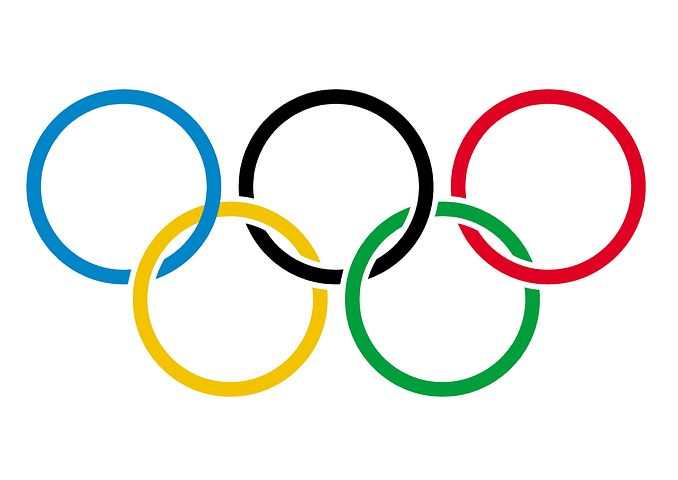

##**About the Dataset:**

---

The dataset used contain information about athletes that participated in either summer or winter season olympics which were held in 120 years (1896 - 2016). Each record contain one athlete's name, age ,height, weight, team, gender and whether he or she won a medal or not. Along with information about the city and the sport that the athlete play.

Using the data mentioned above, we are going to use various techniques to explore and analyze it in order to gain insights about how olympic games are evolving over the years. Additionally, we will implement machine learning algorithms to help predict 'Medal' which is our target class.

##**Case Study Problem:**
---
In this case study, we'll look at the challenge of predicting Olympic medal winners using a variety of characteristics of athletes, their performances, and their backgrounds. Our objective is to develop a predictive model that can precisely predict which athletes will likely take home medals in upcoming Olympic Games , Based on each athlete's demographic information (age, gender, nationality), the sport they participate in, and their performance metrics (height, weight, prior medals won, etc.), we will specifically concentrate on predicting the medal class (gold, silver, bronze, or no medal) for each athlete in the dataset. There are four different medal classes, so this is 
a classification issue with multiple classes.


## **- Importing needed libraries** 

In [1]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 51.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 15.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 5.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 27.5 MB/s eta 0:00:00
 

In [2]:
!pip install missingno

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud
import missingno as msno
from sklearn.impute import KNNImputer
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

## **1-Data Collection**
The first step involves getting an overview about the dataset that will include those steps:
<h1 style="font-size:1rem; color: black;">   </h1>
1-Reading the dataset
<h1 style="font-size:1rem; color: black;">   </h1>
2-Observing rows and columns
<h1 style="font-size:1rem; color: black;">   </h1>
3-Defining data types
<h1 style="font-size:1rem; color: black;">   </h1>
4-Determining unique values in each feature
<h1 style="font-size:1rem; color: black;">   </h1>
5-Feature description
<h1 style="font-size:1rem; color: black;">   </h1>

---

### 1-Reading the dataset

In [5]:
# load the dataset
athletes_df = pd.read_csv('/content/drive/MyDrive/athlete_events.csv')

# .sample() show a subset of the dataset
athletes_df.sample(10)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
216913,108924,Kelsey Serwa,F,20.0,168.0,62.0,Canada,CAN,2010 Winter,2010,Winter,Vancouver,Freestyle Skiing,Freestyle Skiing Women's Ski Cross,NaN
138199,69436,Li Lianli,M,19.0,174.0,77.0,China,CHN,1994 Winter,1994,Winter,Lillehammer,Short Track Speed Skating,"Short Track Speed Skating Men's 1,000 metres",NaN
74319,37744,Lakis Fylaktou,M,16.0,182.0,72.0,Cyprus,CYP,1980 Summer,1980,Summer,Moskva,Swimming,Swimming Men's 100 metres Backstroke,NaN
231579,116181,Christi-Adrian Sudu,M,23.0,189.0,81.0,Canada-1,CAN,1992 Winter,1992,Winter,Albertville,Luge,Luge Mixed (Men)'s Doubles,NaN
156264,78477,Anna Vania Mello,F,21.0,183.0,72.0,Italy,ITA,2000 Summer,2000,Summer,Sydney,Volleyball,Volleyball Women's Volleyball,NaN
228481,114749,Helmut Steiger,M,29.0,174.0,80.0,West Germany,FRG,1988 Winter,1988,Winter,Calgary,Ice Hockey,Ice Hockey Men's Ice Hockey,NaN
9456,5187,"Javier ""Xavi"" Arnau Creus",M,27.0,176.0,76.0,Spain,ESP,2000 Summer,2000,Summer,Sydney,Hockey,Hockey Men's Hockey,NaN
222824,111924,Janusz Lubomir lzak,M,25.0,191.0,95.0,Poland,POL,1932 Summer,1932,Summer,Los Angeles,Rowing,Rowing Men's Coxed Pairs,Silver
9840,5388,Juan Ramn Gregorio Artola Letamenda,M,24.0,NaN,NaN,Spain,ESP,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,Silver
247673,124005,Roman Gazizovich Valiyev,M,24.0,190.0,76.0,Kazakhstan,KAZ,2008 Summer,2008,Summer,Beijing,Athletics,Athletics Men's Triple Jump,NaN


In [6]:
countries = pd.read_csv('/content/drive/MyDrive/noc_regions.csv')
countries

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN
...,...,...,...
225,YEM,Yemen,NaN
226,YMD,Yemen,South Yemen
227,YUG,Serbia,Yugoslavia
228,ZAM,Zambia,NaN


### 2-Observing rows and columns

In [7]:
athletes_df.shape

(271116, 15)

the dataset contain 271116 rows and 15 columns

### 3-Defining data types

In [8]:
athletes_df.dtypes

ID          int64
Name       object
Sex        object
Age       float64
Height    float64
Weight    float64
Team       object
NOC        object
Games      object
Year        int64
Season     object
City       object
Sport      object
Event      object
Medal      object
dtype: object

### 4-Determining number of unique values in each feature

In [9]:
athletes_df.nunique()

ID        135571
Name      134732
Sex            2
Age           74
Height        95
Weight       220
Team        1184
NOC          230
Games         51
Year          35
Season         2
City          42
Sport         66
Event        765
Medal          3
dtype: int64

using .unique() method we can explore the unique values found in each column in the dataset. We can identify that there are 134732 unique names which indicated that there are 134732 participants in the olympics over years.

Number of unique values in 'ID' doesn't equal to number of unique values in 'Name'.The reason of that could be different athletes with the same name.

### 5-Feature description

In [10]:
athletes_df.columns

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal'],
      dtype='object')

**The dataset contain 15 features:**
1. ID - Unique number for each athlete
2. Name - Athlete's name
3. Sex - M or F
4. Age - Integer
5. Height - In centimeters
6. Weight - In kilograms
7. Team - Team name
8. NOC - refers to the three-letter code assigned to each country's National Olympic Committee
9. Games - Year and season
10. Year - Integer
11. Season - Summer or Winter
12. City - Host city
13. Sport - Sport
14. Event - Event
15. Medal - Gold, Silver, Bronze, or NA


## 2- Data Cleaning

In [11]:
countries.nunique()

NOC       230
region    206
notes      21
dtype: int64

In [12]:
countries = countries.drop('notes',axis=1)

dropping the 'notes' column from countries dataset before merging since it's not needed

### Merging datasets


---

Since we might need the 'region' column in our analysis we decided to merge the countries dataframe with the atheltes dataframe on the common column between them which is 'NOC'. 

<center>

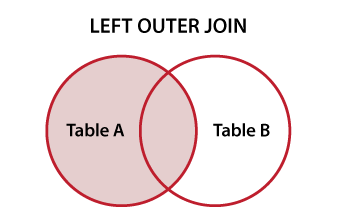 

Left outer join includes all rows from the first dataset which is 'athletes_df' in our case and it it also includes what's shared between the two dataframes.

In [13]:
# merge the two datasets on the 'noc' column
merged_df = pd.merge(athletes_df, countries[['NOC', 'region']], on='NOC', how='left')

athletes_df['region'] = pd.Series(merged_df['region'])

In [14]:
athletes_df

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,NaN,Poland
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",NaN,Poland
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",NaN,Poland
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,NaN,Poland


'region' column refers to the name of the country or region that the NOC represents

### Dropping irrelevant features


---

As mentioned earlier, 'Game' is just a feature that contain the season with the year, but since we have the year in one column and the season in another column there isn't a use of 'Game'.

In [15]:
athletes_df = athletes_df.drop('Games',axis=1)

#viewing the dataset after the drop
athletes_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands


### Checking duplicates


---

Having duplicates in our data can add noise which might negatively affect our analysis, visualization and ML efficiency, so dropping them ensures that the analysis is more accurate.

In [16]:
athletes_df.duplicated().sum()

1385

In [17]:
# Drop duplicates
athletes_df = athletes_df.drop_duplicates()
athletes_df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
271111    False
271112    False
271113    False
271114    False
271115    False
Length: 269731, dtype: bool

In [18]:
#resetting the index
athletes_df = athletes_df.reset_index(drop=True)

After dropping duplicates, the index can become unsorted, which means that the order of the rows is different from how it was originally. Having an unsorted index may affect indexing or slicing operations if we need to access specific rows later on. That's why, we have to reset the index.

### Checking Correlation

---
Correlation is a statistical measure that ranges from -1 to 1, where -1 indicates a strong negative correlation, 0 indicates no correlation, and 1 indicates a strong positive correlation.

Understanding the relationships between the numerical variables in a dataset may be done by checking the correlation.

<ipython-input-19-9699a309762c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = athletes_df.corr()


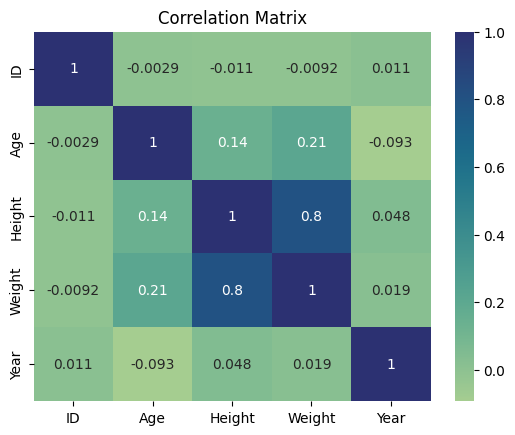

In [19]:
corr = athletes_df.corr()

sns.heatmap(corr, annot=True,cmap="crest")
plt.title('Correlation Matrix')
plt.show()

The correlation matrix shows the correlation between the numerical features we have in the dataset. as the color gets darker meaning that the correlation is higher. We can see that the diagonal is 1 because of the correlation between the feature and itself. Additionally, there is a strong correlation between the height and weight and it equals to 0.8. Age is weakly correlated with both weight and height.

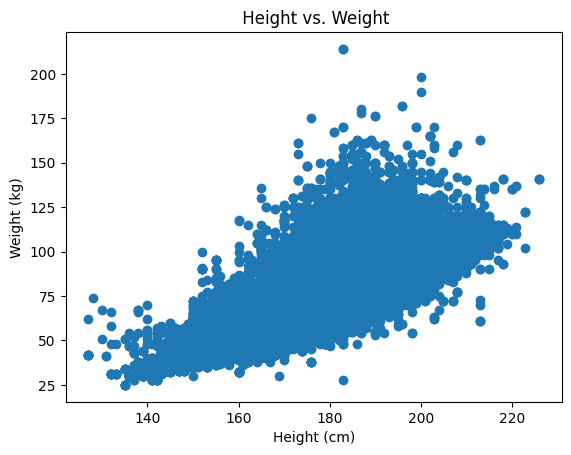

In [20]:
plt.scatter(athletes_df['Height'], athletes_df['Weight'])
plt.xlabel('Height (cm)')
plt.ylabel('Weight (kg)')
plt.title(' Height vs. Weight')
plt.show()

Height and weight have a very strong positive relationship, which means that as height increases, the weight increases.
We can see that there are lot of datapoints overlapping because of the large number of records we the dataset contain.

### Checking the distribution

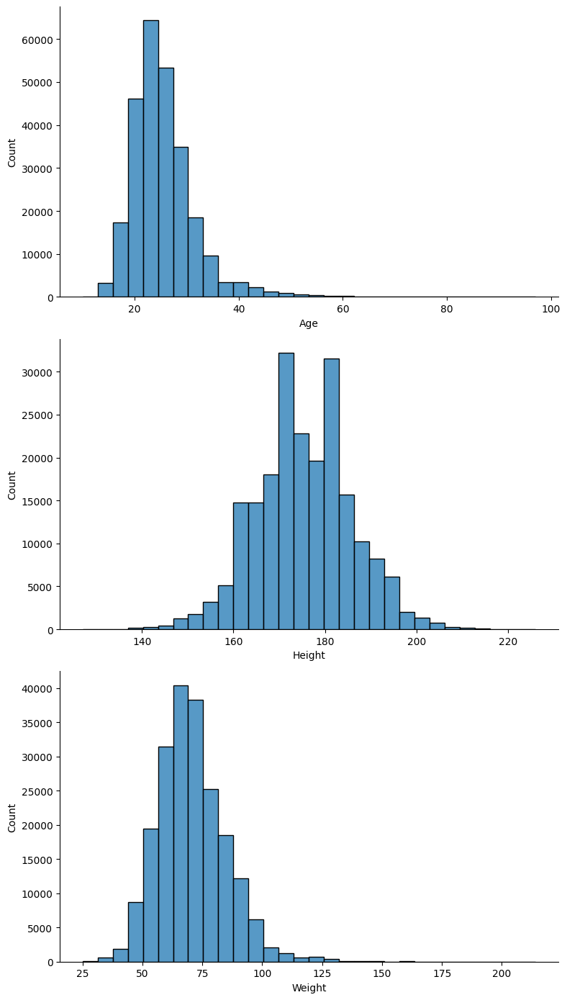

In [21]:
cols = ['Age','Height','Weight']

# multiple subplots
fig, axes = plt.subplots(nrows=len(cols), figsize=(8, 14))

# Loop over the columns and plot a histogram on each subplot
for i, col in enumerate(cols):
    sns.histplot(data=athletes_df, x=col, ax=axes[i],bins=30)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')
    axes[i].spines['right'].set_visible(False)
    axes[i].spines['top'].set_visible(False)

plt.tight_layout()
plt.show()

Using histograms, this graph displays the distribution of age, height, and weight data. With the x-axis representing the value range and the y-axis showing the number of observations falling within that range, each variable is represented separately on a subplot. The histograms give a general overview of the shape, central tendency, and spread of each variable's distribution. 

The height column's normal distribution shows that athletes' heights generally follow a typical pattern, with most of them being of ordinary height and only a small number being either particularly tall or short.

On the other hand, the right skewness of the age and weight columns indicates that fewer athletes are older or larger and that most athletes are younger and lighter or of average weight. This is probably because Olympic sports frequently favor athletes who are younger and lighter since they are more agile and have greater endurance, which makes it simpler for them to compete at their best.

### Dealing with missing values

In [22]:
athletes_df.isnull().sum()

ID             0
Name           0
Sex            0
Age         9315
Height     58814
Weight     61527
Team           0
NOC            0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     229959
region       370
dtype: int64

<Axes: >

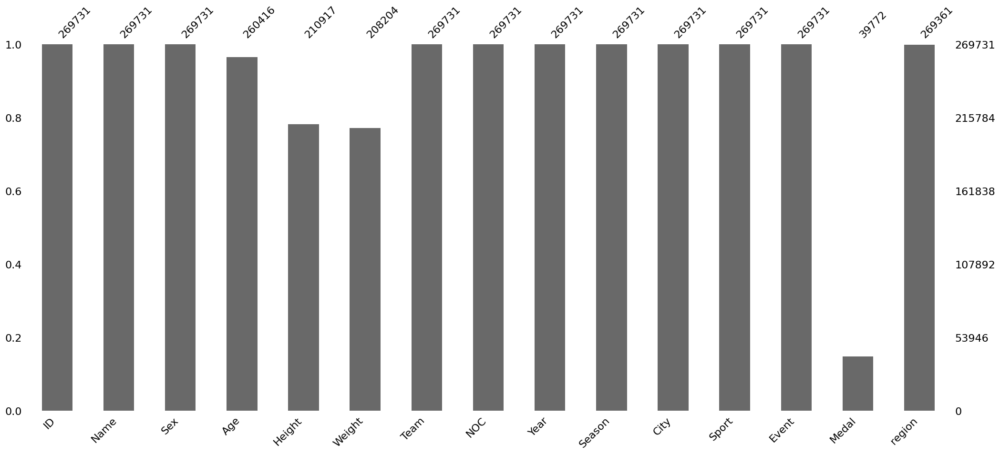

In [23]:
msno.bar(athletes_df)

Using missgno library we are able to plot a barplot that shows if there is any misisng values in each column. if the number above the bars are less than the total number of records we have, then that means that there are misisng values. so as seen in the graph we can notice that there are missing values in each of the 'Age' ,'Height' ,'Weight' ,'region' and 'Medal' columns.

In [24]:
athletes_df[athletes_df['Age'].isnull()]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
147,54,Mohamed Jamshid Abadi,M,NaN,NaN,NaN,Iran,IRI,1948,Summer,London,Boxing,Boxing Men's Heavyweight,NaN,Iran
152,58,Georgi Abadzhiev,M,NaN,NaN,NaN,Bulgaria,BUL,1924,Summer,Paris,Cycling,"Cycling Men's Road Race, Individual",NaN,Bulgaria
153,58,Georgi Abadzhiev,M,NaN,NaN,NaN,Bulgaria,BUL,1924,Summer,Paris,Cycling,"Cycling Men's Road Race, Team",NaN,Bulgaria
162,66,Mohamed Abakkar,M,NaN,156.0,48.0,Sudan,SUD,1972,Summer,Munich,Boxing,Boxing Men's Flyweight,NaN,Sudan
212,102,Sayed Fahmy Abaza,M,NaN,NaN,NaN,Egypt,EGY,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Egypt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269294,135368,Antonio A. Zucchi,M,NaN,NaN,NaN,Argentina,ARG,1948,Summer,London,Hockey,Hockey Men's Hockey,NaN,Argentina
269389,135416,Star Zulu,M,NaN,NaN,NaN,Zambia,ZAM,1984,Summer,Los Angeles,Boxing,Boxing Men's Bantamweight,NaN,Zambia
269408,135426,Max Zumstein,M,NaN,NaN,NaN,Switzerland,SUI,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,NaN,Switzerland
269419,135434,Edmundo Ziga Erraz,M,NaN,180.0,95.0,Chile,CHI,1948,Summer,London,Athletics,Athletics Men's Hammer Throw,NaN,Chile


by filtering the data with records that contain null values in the 'Age' column we noticed that there are some records that have null values in the three columns 'Age' ,'Height' and 'Weight'. Since null values of 'Age' column only represent 3.3% of our data which is a very small portion, dropping them won't really affect the overall data. 

However, dropping nulls from 'Height' and 'Weight' columns will result in losing almost 21.1% and 22.2% of our data respectively, which is a significant loss. so we are going to use the KNN imputer. It estimates the missing values based on the k-nearest values of it. Assigning 'n_neighbor' to 5 means that each missing value is estimated based on the values of its five nearest neighbors.

In [25]:
athletes_df = athletes_df.dropna(subset=['Age'])

In [26]:
athletes_df.isnull().sum()

ID             0
Name           0
Sex            0
Age            0
Height     50376
Weight     53074
Team           0
NOC            0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     221372
region       356
dtype: int64

In [27]:
# splitting
m = athletes_df.loc[athletes_df['Sex'] == 'M']
f = athletes_df.loc[athletes_df['Sex'] == 'F']

imputer = KNNImputer(n_neighbors=5)

# missing values for male
m[['Height', 'Weight']] = imputer.fit_transform(m[['Height', 'Weight']])

# missing values for female
f[['Height', 'Weight']] = imputer.fit_transform(f[['Height', 'Weight']])

athletes_df = pd.concat([m, f])

<ipython-input-27-f32b621def8a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m[['Height', 'Weight']] = imputer.fit_transform(m[['Height', 'Weight']])
<ipython-input-27-f32b621def8a>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f[['Height', 'Weight']] = imputer.fit_transform(f[['Height', 'Weight']])


In [28]:
athletes_df.isnull().sum()

ID             0
Name           0
Sex            0
Age            0
Height         0
Weight         0
Team           0
NOC            0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     221372
region       356
dtype: int64

In [29]:
# Medal feature type is object so fill with a string
athletes_df['Medal'].fillna('no medal', inplace = True)

the missing values in 'Medal' means that the athlete hadn't won a medal so we will fill them with 'no medal' 

In [30]:
athletes_df.isnull().sum()

ID          0
Name        0
Sex         0
Age         0
Height      0
Weight      0
Team        0
NOC         0
Year        0
Season      0
City        0
Sport       0
Event       0
Medal       0
region    356
dtype: int64

In [31]:
athletes_df = athletes_df.dropna(subset=['region'])

After checking if there were any more missing values to handle, we found 356 missing values in 'region' which is most probably caused by the left merge that we did earlier. 356 is considered very small portion since we have a lot of records, so dropping them won't make a huge effect later on.

In [32]:
athletes_df.isnull().sum()

ID        0
Name      0
Sex       0
Age       0
Height    0
Weight    0
Team      0
NOC       0
Year      0
Season    0
City      0
Sport     0
Event     0
Medal     0
region    0
dtype: int64

### Detecting outliers
---
A dataset may contain outliers for lots of reasons. One explanation is measurement inaccuracy, which can be brought on by  human mistake. Another justification is the data's inherent variability, which may result from biological, environmental, or other causes. Data entry mistakes or improper data processing might potentially result in the appearance of outliers. Furthermore, outliers might actually represent extreme or unusual observations in the data, and eliminating them might mean losing crucial information. So it's absolutely essential to carefully examine outliers and decide whether to eliminate or include them in the analysis.


In [33]:
athletes_df.dtypes

ID          int64
Name       object
Sex        object
Age       float64
Height    float64
Weight    float64
Team       object
NOC        object
Year        int64
Season     object
City       object
Sport      object
Event      object
Medal      object
region     object
dtype: object

In [34]:
athletes_df.describe()

,ID,Age,Height,Weight,Year
count,260060.000000,260060.000000,260060.000000,260060.000000,260060.000000
mean,68283.688576,25.457756,175.756359,71.272114,1980.310967
std,38997.144432,6.162573,9.650537,13.154687,28.503153
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34746.000000,21.000000,169.000000,62.000000,1964.000000
50%,68198.000000,24.000000,178.000000,72.000000,1988.000000
75%,102101.000000,28.000000,180.000000,76.000000,2004.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


In [35]:
# boxplots of the numeric columns to visualize outliers
fig = px.box(athletes_df, y=['Age','Height','Weight'])
fig.show()

The boxplot helps showing the five-number summary which are min ,q1, median ,max and q3. In the plot above, by hovering over the 'Age' boxplot we can see that the minimum age = 10, median = 24 and maximum age = 97. 

For the 'Height' boxplot, the minimum height = 127, median=178 and the maximum height is 226.
Lastly, the 'Weight' boxplot shows that the minimum weight = 25,median =72 and the maximum weight = 214.

Moreover, the datapoints beyond the whiskers are the extreme values/outliers which can be easily seen in the boxplot above


In [36]:
# a function that help detect outliers
def detect_outliers(column):
    # find q1 and q3 values
    q1, q3 = np.percentile(sorted(column), [25, 75])
 
    # compute IRQ
    IQR = q3 - q1
 
    # find lower and upper boundries
    lower = q1 - (1.5 * IQR)
    upper = q3 + (1.5 * IQR)
 
    outliers = [x for x in column if x <= lower or x >= upper]
 
    return outliers

This function first finds the q1 and q3 to compute the IQR and return a list of the outliers in that column you passed as the parameter. if there isn't any outliers in the column passed then it will return an empty list.

In [37]:
print('num of outliers in "Age" = ' ,len(detect_outliers(athletes_df['Age'])))
print('num of outliers in "Height" =' ,len(detect_outliers(athletes_df['Height'])))
print('num of outliers in "Weight" = ' ,len(detect_outliers(athletes_df['Weight'])))

num of outliers in "Age" =  9408
num of outliers in "Height" = 7826
num of outliers in "Weight" =  10660


After using the KNN imputer to fill the missing values in 'Age' ,'Height' and 'Weight', we noticed that the number of outliers in 'Height' and 'Weight' decreased compared to when we tried to fill them with the mean.

In [38]:
#lists of outliers
outliers = detect_outliers(athletes_df['Age'])
outliers2 = detect_outliers(athletes_df['Height'])
outliers3 = detect_outliers(athletes_df['Weight'])

outliers_age_df = athletes_df.loc[athletes_df['Age'].isin(outliers)]
outliers_height_df = athletes_df.loc[athletes_df['Height'].isin(outliers2)]
outliers_weight_df = athletes_df.loc[athletes_df['Weight'].isin(outliers3)]

outliers_df = pd.concat([outliers_age_df, outliers_height_df, outliers_weight_df], ignore_index=True)

outliers_df.sample(10)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
20154,48326,Jrgen Heuser,M,27.0,188.000000,134.000000,East Germany,GDR,1980,Summer,Moskva,Weightlifting,Weightlifting Men's Super-Heavyweight,Silver,Germany
17607,6461,Sergey Babikov,M,44.0,170.000000,100.000000,Tajikistan,TJK,2012,Summer,London,Shooting,"Shooting Men's Air Pistol, 10 metres",no medal,Tajikistan
3232,49191,Ludwig von Hofmann,M,66.0,178.895419,75.786633,Germany,GER,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",no medal,Germany
15505,63867,Nikolett Krausz,F,15.0,148.000000,41.000000,Hungary,HUN,1996,Summer,Atlanta,Gymnastics,Gymnastics Women's Floor Exercise,no medal,Hungary
19017,29954,Sen Joseph Drea,M,25.0,190.000000,98.000000,Ireland,IRL,1972,Summer,Munich,Rowing,Rowing Men's Single Sculls,no medal,Ireland
6000,97942,Ramiro Quintana,M,39.0,172.000000,70.000000,Argentina,ARG,2016,Summer,Rio de Janeiro,Equestrianism,"Equestrianism Mixed Jumping, Team",no medal,Argentina
23274,96607,Aleksandr Vladimirovich Povetkin,M,24.0,188.000000,98.000000,Russia,RUS,2004,Summer,Athina,Boxing,Boxing Men's Super-Heavyweight,Gold,Russia
27511,115870,Kerri Allyson Strug (-Fischer),F,18.0,142.000000,37.000000,United States,USA,1996,Summer,Atlanta,Gymnastics,Gymnastics Women's Balance Beam,no medal,USA
15878,78826,Scarleth Elizabeth Mercado Lpez,F,19.0,152.000000,53.000000,Nicaragua,NCA,2016,Summer,Rio de Janeiro,Weightlifting,Weightlifting Women's Featherweight,no medal,Nicaragua
1080,17142,Charles Gustave Cabaret,M,41.0,178.895419,75.786633,France,FRA,1908,Summer,London,Archery,Archery Men's Continental Style,Bronze,France


In [39]:
outliers_df.shape

(27894, 15)

there are 27894 rows of the original dataset which contain outliers

In [40]:
outliers_df['Sex'].value_counts()

M    21787
F     6107
Name: Sex, dtype: int64

In [41]:
outliers_df.describe()

,ID,Age,Height,Weight,Year
count,27894.000000,27894.000000,27894.000000,27894.000000,27894.000000
mean,68882.309995,31.505557,180.299558,83.502802,1982.650319
std,39038.145107,11.435811,18.445313,25.962758,29.945762
min,18.000000,10.000000,127.000000,25.000000,1896.000000
25%,35164.500000,23.000000,172.000000,69.000000,1968.000000
50%,69483.000000,28.000000,180.000000,86.000000,1992.000000
75%,102968.250000,41.000000,196.800000,101.000000,2004.000000
max,135558.000000,97.000000,226.000000,214.000000,2016.000000


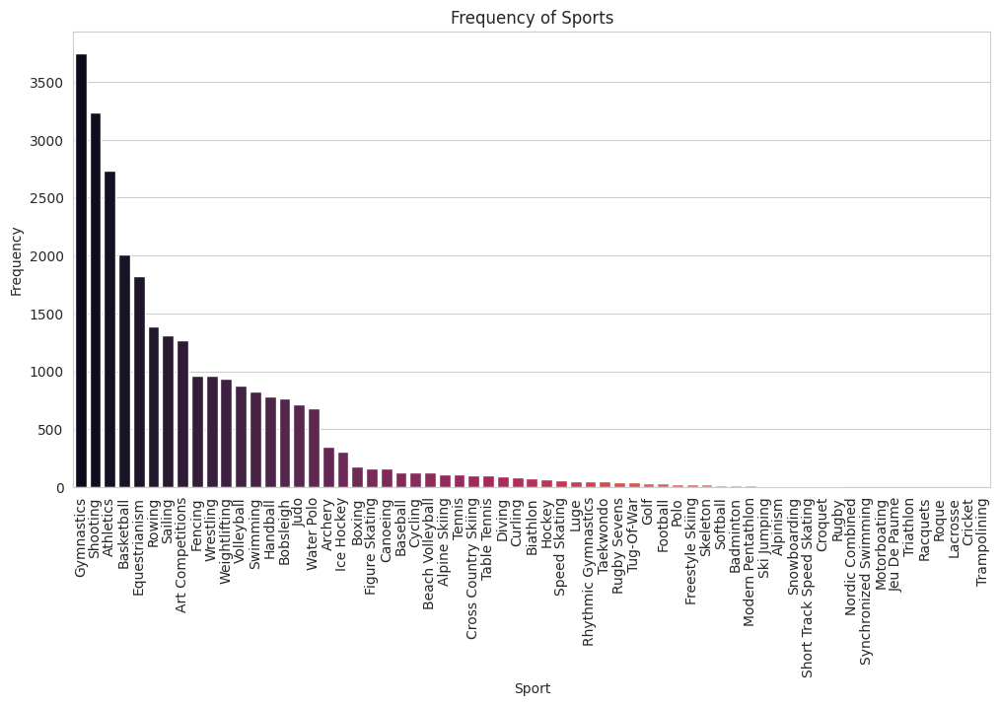

In [53]:
# count the frequency of each sport
sports = outliers_df['Sport'].value_counts()

# plot the bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=sports.index, y=sports.values, palette='rocket')
plt.xticks(rotation=90)
plt.xlabel('Sport')
plt.ylabel('Frequency')
plt.title('Frequency of Sports')
plt.show()

With a frequency of almost 3700, Gymnastics is the most frequent sport in the outliers_df, followed by Shooting with a frequency that's almost 3250. followed by athletics which existed around 2570 times in the outliers_df. Basketball and equestrian sports had frequencies of 2000 and 1900 respectively, followed by rowing with a frequency of 1400.


The unusual ranges in age, weight, and height may be related to the physical demands of gymnastics, shooting, athletics, and basketball. The high level of flexibility, balance, strength, and control required for gymnastics may help to explain the outliers in terms of height and weight. The athlete's height may also have an impact on shooting, which may need a steady hand and strong vision. Physical characteristics including an athlete's height, weight, and body composition may be crucial determinants of how well they do in specific athletic events. For instance, long-distance runners may have a different body type than sprinters.

Basketball is a physically demanding activity that requires a lot of running, jumping, and handling the ball, therefore it may be necessary to be physically fit and have some athletic ability. Therefore, basketball may be a better fit for athletes who are taller, heavier, or have a different body type than other sports.  In conclusion, the unusual physical requirements of gymnastics, shooting, athletics, and basketball, which are reasons for specific physical qualities or talents for best performance, may have an impact on the outliers in age, weight, and height in these sports.

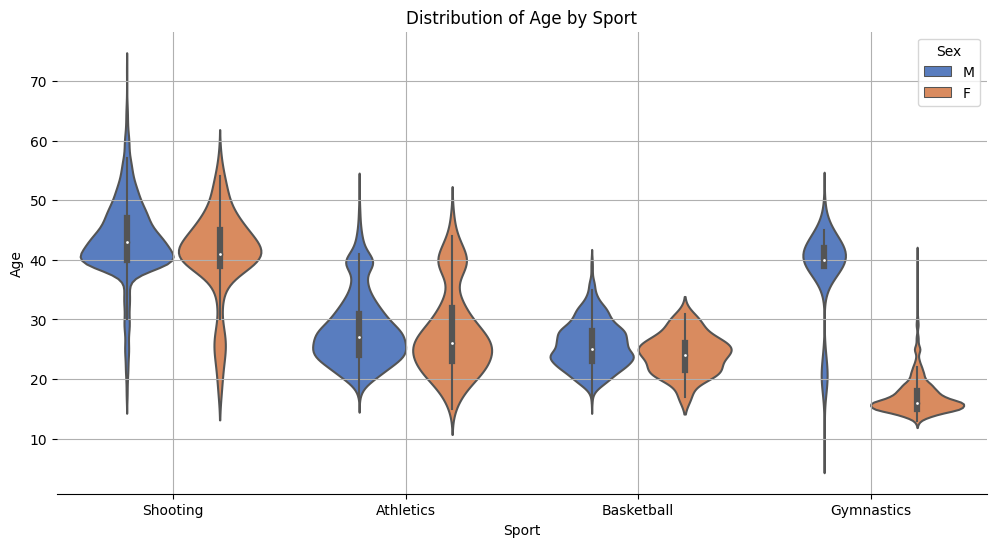

In [43]:
sports = ['Gymnastics', 'Shooting', 'Basketball','Athletics']
df = outliers_df[outliers_df['Sport'].isin(sports)]

# Create the violin plot
plt.figure(figsize=(12,6))
sns.violinplot(data=df, x='Sport', y='Age', palette='muted', inner='box', hue='Sex')
sns.despine(left=True)
plt.title('Distribution of Age by Sport')
plt.grid(True)
plt.xlabel('Sport')
plt.ylabel('Age')
plt.show()

This plot shows the distribution of athlete age for four different sports (Gymnastics, Shooting, Basketball, and Athletics). Each sport is represented by a separate violin plot, with the age distribution for male in blue and female athletes in orange. The width of the violin plot shows the frequency of ages at different levels, while the box inside the plot shows the interquartile range of the age distribution. 

In addition, we can see that gymnastics female players' age distribution is way less than the gymnastics male players' age. whereas for the shooting ,athletics and basketball there isn't a much of difference between male and female. For the female athletes who plays shooting, their age varies between 13 and 62 whereas the male shooting athletes age varies between 15 and 75. Athletics players age varies between 11 and 55. For the baketball players, we can see almost a normal distribution where the age varies between 14 and 41.

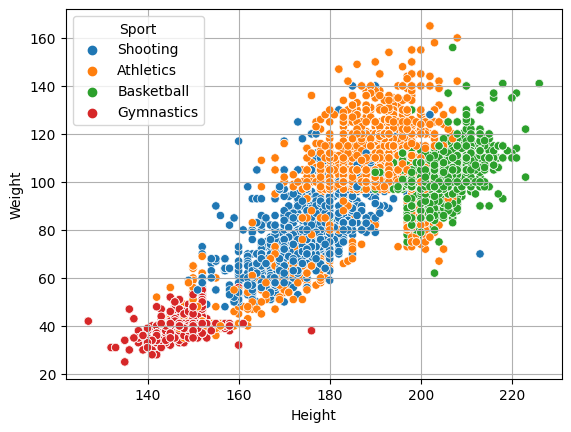

In [44]:
df = outliers_df[outliers_df['Sport'].isin(['Gymnastics', 'Shooting', 'Basketball','Athletics'])]

# scatterplots of height and weight for each sport
sns.scatterplot(data=df, x='Height', y='Weight', hue='Sport')
# adding a grid
plt.grid(True)

This plot shows scatterplots of height and weight for the top 4 frequent sport in the outliers_df. The sports included are Gymnastics, Shooting, Basketball, and Athletics. Each data point represents an athlete, and the position of the point on the plot represents their height and weight. The color of the point indicates the sport that the athlete participates in.

By looking at the plot, we can see that there is some variation in the height and weight of athletes across different sports. For example, basketball players tend to be taller and heavier than athletes in other sports, while gymnasts tend to be shorter and lighter. We can also see that there is some overlap between the different sports, indicating that there is some variation within each sport as well. In addition, we can also see that the green points which represents athletics are more densed in the upper area which indicates for higher height and weight but there is still some points spreaded in the lower area. As can be seen, compared to athletes in other sports, shooters tend to have a wider range of heights and weights. This may suggest that there is a wider variety of body types among shooting athletes.

## **3. Data Exploration and Analysis**

In [45]:
gender = athletes_df.Sex.value_counts()
gender

M    186220
F     73840
Name: Sex, dtype: int64

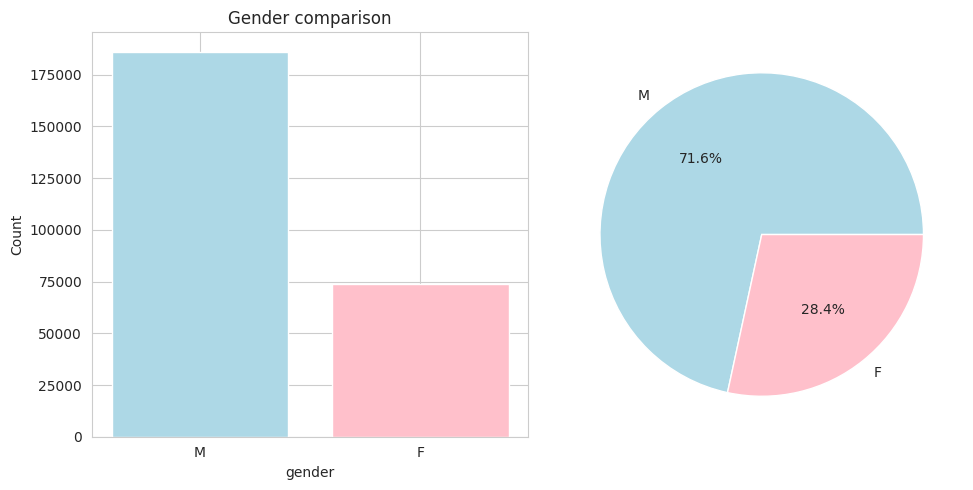

In [46]:
sns.set_style("whitegrid")

# create a figure with subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# bar chart 
colors = {'M': 'lightblue', 'F': 'pink'}
ax1.bar(x=gender.index, height=gender.values, color=[colors[x] for x in gender.index])
ax1.set_title('Gender comparison')
ax1.set_xlabel('gender')
ax1.set_ylabel('Count')

# pie chart 
sizes = [gender['M'], gender['F']]
labels = ['M', 'F']
ax2.pie(sizes, labels=labels, colors=[colors[x] for x in labels], autopct='%1.1f%%')

plt.tight_layout()
plt.show()

The data shows that there is a large disparity between the number of female and male athletes, with 186,220 male and 73,840 female. There is around 2.5 times as many males as females.

### Mean Age

In [47]:
age_mean = athletes_df.groupby(['Year', 'Sex'], as_index=False)['Age'].mean()
fig = px.line(age_mean, x='Year', y='Age', color='Sex')
fig.update_xaxes(title='Year')
fig.update_yaxes(title='Mean Age')
fig.update_layout(title='Mean Age of Athletes over Time')
fig.show()

This plot is showing the mean age of athletes over time by gender. The x-axis represents the year, the y-axis represents the mean age, and the line colors represent the gender (blue for males, red for females).

By looking at the plot, we can see that the mean age for both genders has slightly decreased  over time, but there are some interesting patterns to note. One significant increase in mean age for females can be seen in 1904. This increase spikes upwards in that year, showing that the mean age for females was much higher in 1904 compared to the surrounding years. Additionally, we can see another sharp increase in 1908. These sharp increases need to further exploration.

In [59]:
# filter the dataframe of female athletes in the 1904 
female_1904 = athletes_df[(athletes_df['Year'] == 1904) & (athletes_df['Sex'] == 'F')]

# sort by age in descending order
sorted = female_1904.sort_values('Age', ascending=False)
sorted.head(10)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
189910,95906,"Lida Peyton ""Eliza"" Pollock (McMillen-)",F,63.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double Columbia Round,Bronze,USA
189911,95906,"Lida Peyton ""Eliza"" Pollock (McMillen-)",F,63.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double National Round,Bronze,USA
189912,95906,"Lida Peyton ""Eliza"" Pollock (McMillen-)",F,63.0,167.843921,60.024239,Cincinnati Archers,USA,1904,Summer,St. Louis,Archery,Archery Women's Team Round,Gold,USA
261522,131533,Emily Woodruff (Smiley-),F,58.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double Columbia Round,no medal,USA
261523,131533,Emily Woodruff (Smiley-),F,58.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double National Round,no medal,USA
261524,131533,Emily Woodruff (Smiley-),F,58.0,167.843921,60.024239,Cincinnati Archers,USA,1904,Summer,St. Louis,Archery,Archery Women's Team Round,Gold,USA
44150,22877,Emma C. Cooke,F,55.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double Columbia Round,Silver,USA
44151,22877,Emma C. Cooke,F,55.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double National Round,Silver,USA
98922,50366,"Matilda ""Lida"" Howell (Scott-)",F,44.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double Columbia Round,Gold,USA
98923,50366,"Matilda ""Lida"" Howell (Scott-)",F,44.0,167.843921,60.024239,United States,USA,1904,Summer,St. Louis,Archery,Archery Women's Double National Round,Gold,USA


In [60]:
female_1904['Sport'].unique()

array(['Archery'], dtype=object)

Filtering the dataset to have records that are only in 1904 and contain female to find the reason of that significant increase (if existed) in the previous plot. from displaying the top 10 female athletes with the highest age in the 1904 Olympics we can easily see that the sport that they are playing is 'Archery' so that might be the reason of having a very high age mean compared to other years.

In [61]:
# create a filtered dataframe with only Archery sport
archery = athletes_df[athletes_df['Sport'] == 'Archery']

#  mean age of Archery athletes over time
archery_age_mean = archery.groupby('Year', as_index=False)['Age'].mean()
fig = px.line(archery_age_mean, x='Year', y='Age')

# adding labels
fig.update_xaxes(title='Year')
fig.update_yaxes(title='Mean Age')
fig.update_layout(title='Mean Age of Archery Athletes over Time')
fig.show()

The line plot shows the mean age of Archery athletes over time, based on the filtered dataframe of athletes who competed in Archery. The x-axis represents the years and the y-axis represents the mean age of the athletes.

The graph demonstrates that, despite the peak that happened in 1904 which we explained previously and it equals to 49 years old, the mean age of archery athletes has typically decreased over time.

In [62]:
fig = px.box(archery, y='Age')

fig.update_yaxes(title='Age')
fig.update_xaxes(title='Archery')
fig.update_layout(title='Age of Archery Athletes')
fig.show()

by plotting the box plot of 'Archery' sport against the age we are able to see the minimum age playing archery which is 14 years old and the maximum age is 71. we can see that the age 49 is beyond the upper whisker which means it is considered as an outlier for the archery game. which explains the significant rise of the mean age in 1904.

In [50]:
# filter the dataframe of female athletes in the 1908
female_1908 = athletes_df[(athletes_df['Year'] == 1908) & (athletes_df['Sex'] == 'F')]
female_1908.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
1755,975,Anna Mrtha Vilhelmina Adlerstrhle (von Oelreich-),F,39.0,167.843921,60.024239,Sweden,SWE,1908,Summer,London,Tennis,"Tennis Women's Singles, Covered Courts",Bronze,Sweden
8618,4739,Gertrude Appleyard (Tuppen-),F,43.0,167.843921,60.024239,Great Britain,GBR,1908,Summer,London,Archery,Archery Women's Double National Round,no medal,UK
9343,5142,Ethel Isabel Armitage (MacLaren-),F,34.0,167.843921,60.024239,Great Britain,GBR,1908,Summer,London,Archery,Archery Women's Double National Round,no medal,UK
11849,6465,Ellen Mabel Liederskron Babington (Horne-),F,30.0,167.843921,60.024239,Great Britain,GBR,1908,Summer,London,Archery,Archery Women's Double National Round,no medal,UK
23843,12580,Adelaide Harriet Matilda Boddam-Whetham (Manni...,F,47.0,167.843921,60.024239,Great Britain,GBR,1908,Summer,London,Archery,Archery Women's Double National Round,no medal,UK


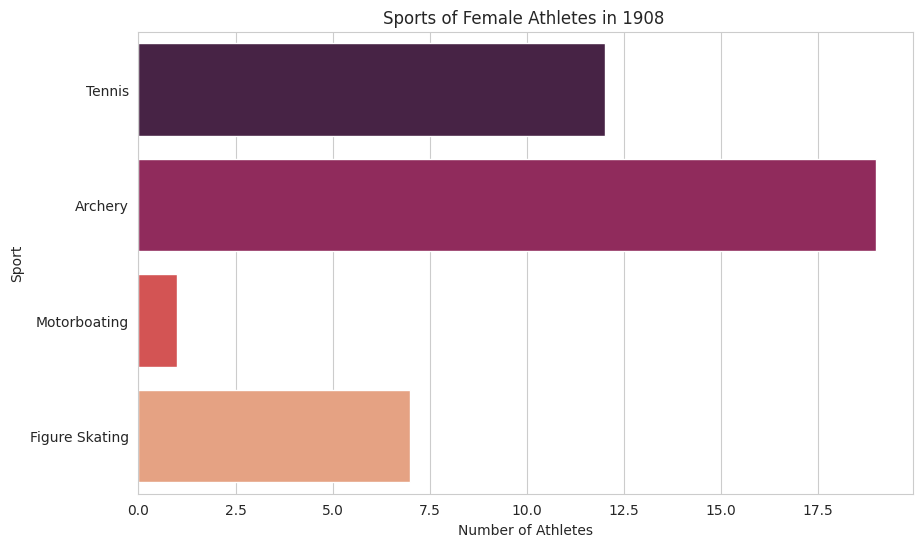

In [57]:
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.countplot(y='Sport', data=female_1908, palette='rocket')
plt.title("Sports of Female Athletes in 1908 ")
plt.xlabel('Number of Athletes')
plt.ylabel('Sport')
plt.show()

By looking at the barplot above we can see that the Archery sport was the most played sport from female athletes in 1908, which explains the sudden increase that we saw in the mean age line plot previously .Moreover, Tennis also was played alot in 1908 by the female athletes so the mean age of the Tennis players might also be higher than the mean age of other played sports.

In [58]:
# create a filtered dataframe with only Tennis sport
tennis = athletes_df[athletes_df['Sport'] == 'Tennis']

#  mean age of Tennis athletes over time
tennis_age_mean = tennis.groupby('Year', as_index=False)['Age'].mean()
fig = px.line(tennis_age_mean, x='Year', y='Age')

# adding labels
fig.update_xaxes(title='Year')
fig.update_yaxes(title='Mean Age')
fig.update_layout(title='Mean Age of Tennis Athletes over Time')
fig.show()

The trend in the mean age of tennis competitors during various Olympic years is seen in this line plot. The average age was 21 in 1896, and it rose significantly to 28 in 1900. Following a slight decline to 27 in the following season, the mean age significantly decreased to 23 in 1906. The mean age however increased significantly the next year, to 30. The mean age then fluctuated slightly, but until 1924 there were no notable variations. The average age declined steadily until it reached 23 between 1924 and 1992. The mean age increased steadily after 1992, eventually reaching 28.

### Seasons

In [63]:
Season = athletes_df.Season.value_counts()
Season

Summer    211781
Winter     48279
Name: Season, dtype: int64

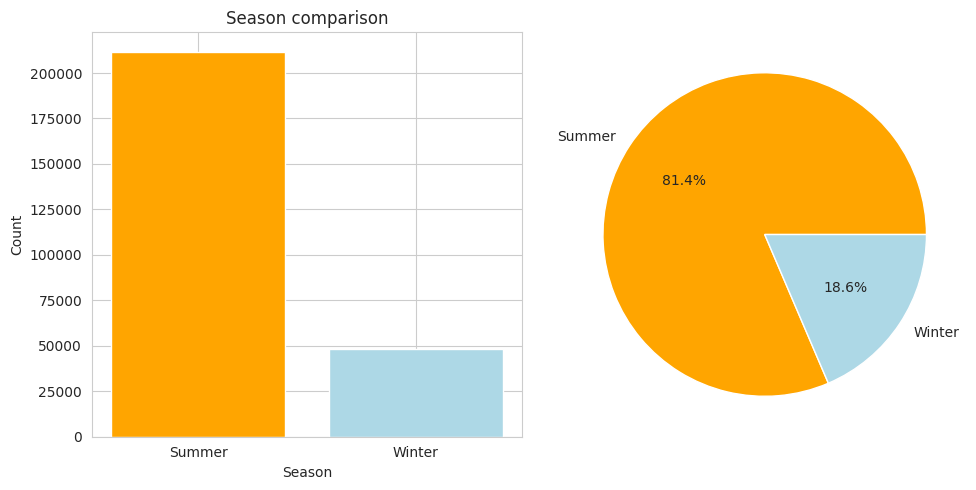

In [64]:
sns.set_style("whitegrid")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# bar chart
colors = {'Winter': 'lightblue', 'Summer': 'Orange'}
ax1.bar(x=Season.index, height=Season.values, color=[colors[x] for x in Season.index])
ax1.set_title('Season comparison')
ax1.set_xlabel('Season')
ax1.set_ylabel('Count')

# pie chart
sizes = [Season['Summer'], Season['Winter']]
labels = ['Summer', 'Winter']
ax2.pie(sizes, labels=labels, colors=[colors[x] for x in labels], autopct='%1.1f%%')

plt.tight_layout()
plt.show()

The data has been divided into the two separate seasons of summer and winter. With 211,781 games played in the summer and only 48,279 in the winter, the results show a significant contrast in the amount of games played between the two seasons. This shows that compared to the winter season, the summer season is substantially more busy in terms of sports and games.

In [65]:
gender_counts = athletes_df.groupby(['Year', 'Sex'])['ID'].nunique().unstack()

# interactive stacked area plot
fig = px.area(gender_counts, x=gender_counts.index, y=gender_counts.columns, 
              title='Male and Female Participants over the Years', 
              labels={'value': 'Number of Athletes', 'variable': 'Gender', 'index': 'Year'})

fig.show()

The graph displays the total number of male and female competitors at the Olympic Games over time. The number of athletes is represented on the y-axis, and the years 1896 to 2016 are represented on the x-axis. The male and female participants are shown by two colors on the area plot, and the shaded areas reflect how the participation count has evolved over time. We can observe that historically, there have been more men than women participating in an event. Additionally, we notice fluctuations in the number of competitors over time, particularly after 1992. 1992 had the highest number of participants since it was the last year when summer and winter olympics where held together.

After 1992, the Winter Games began in 1994, followed by the Summer Games in 1996, then the Winter Games in 1998 to complete a 4 year cycle as known for the olympic games, and so on. 

In [66]:
summer = athletes_df[athletes_df['Season'] == 'Summer']

# Group by year and sex for summer
counts = summer.groupby(['Year', 'Sex']).size().reset_index(name='count')

# line plots 
fig = px.line(counts, x='Year', y='count', color='Sex')

# labels
fig.update_layout(title='Number of Athletes in Summer Olympics',
                  xaxis_title='Year',
                  yaxis_title='Number of Athletes')

fig.show()

With separate lines for male and female athletes, the plot demonstrates the trend of the number of athletes competing in the Summer Olympics over time. It makes it simple for us to compare the proportion of male and female athletes over time and identify any patterns or trends. For instance, we may observe that both the number of male and female athletes has generally increased over time. Additionally, we can observe that there have been years with significant variations in the number of of male athletes. 1992 saw the most male athletes compete throughout the summer months which was 8794. We can also see that female athletes started to participate in summer olympics from 1900 whereas the male athletes started from 1896.

In [67]:
winter = athletes_df[athletes_df['Season'] == 'Winter']

# group by year and sex for winter
wcounts = winter.groupby(['Year', 'Sex']).size().reset_index(name='count')

fig = px.line(wcounts, x='Year', y='count', color='Sex')

# labels
fig.update_layout(title='Number of Athletes in Winter Olympics',
                  xaxis_title='Year',
                  yaxis_title='Number of Athletes')

fig.show()

The number of athletes competing during the winter season increased throughout time without noticeably declining as compared to the summer season. In addition, we can see that the last olympics in the winter season was in 2014 but the summer season as discussed previously it ended in 2016.

In [68]:
# checking the sports played in summer season
athletes_df[athletes_df['Season'] == 'Summer'].Sport.unique()

array(['Basketball', 'Judo', 'Football', 'Tug-Of-War', 'Swimming',
       'Badminton', 'Gymnastics', 'Athletics', 'Art Competitions',
       'Wrestling', 'Water Polo', 'Sailing', 'Rowing', 'Fencing',
       'Equestrianism', 'Shooting', 'Boxing', 'Taekwondo', 'Cycling',
       'Weightlifting', 'Diving', 'Canoeing', 'Handball', 'Tennis',
       'Modern Pentathlon', 'Hockey', 'Volleyball', 'Baseball',
       'Table Tennis', 'Archery', 'Trampolining', 'Beach Volleyball',
       'Golf', 'Rugby Sevens', 'Triathlon', 'Rugby', 'Lacrosse', 'Polo',
       'Cricket', 'Ice Hockey', 'Racquets', 'Croquet', 'Figure Skating',
       'Jeu De Paume', 'Roque', 'Motorboating', 'Basque Pelota',
       'Alpinism', 'Aeronautics', 'Softball', 'Synchronized Swimming',
       'Rhythmic Gymnastics'], dtype=object)

In [69]:
# checking the number of sports played in summer
athletes_df[athletes_df['Season'] == 'Summer'].Sport.nunique()

52

there are 52 different sports played in the summer season

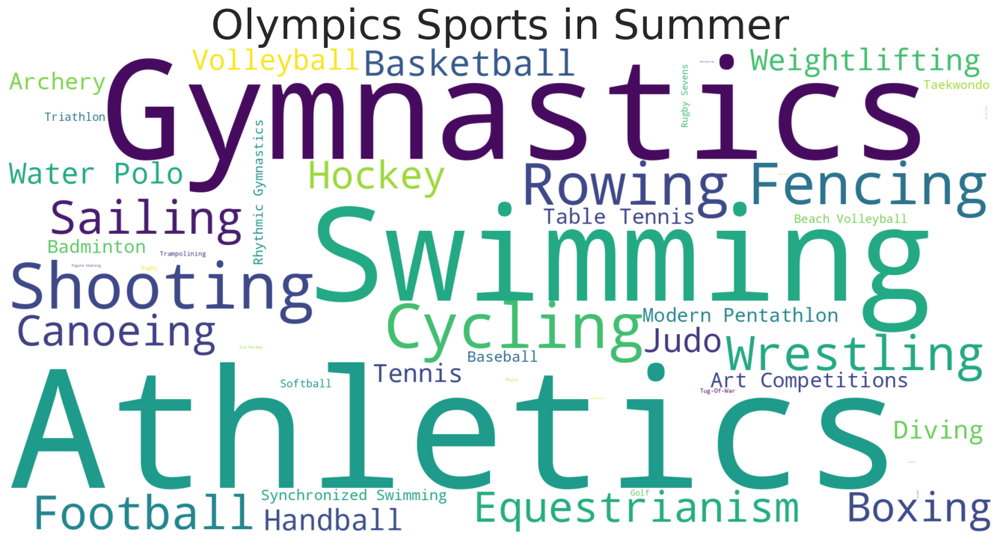

In [70]:
summer = athletes_df[athletes_df['Season'] == 'Summer']
counts = summer['Sport'].value_counts()
    
sns.set_style("ticks")

wordcloud = WordCloud(
            width=2000,
            height=1000, 
            scale=1,
            normalize_plurals=False,
            repeat=False,
            random_state=42,
            background_color='white')

wordcloud.generate_from_frequencies(frequencies=counts)
plt.figure(figsize=(17,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Olympics Sports in Summer', fontsize=40)
plt.show()

wordclouds help to show the most frequent words, so in this wordcloud which shows the sports that are played in summer season we can easily see that 'Athletics' is the most played sport in the summer, followed by gymnastics and swimming. Likewise, the sports that are represented in small words are the least played sports in the summer ,such as trampolining and Tug-of-war.

In [71]:
# checking the sports played in winter season
athletes_df[athletes_df['Season'] == 'Winter'].Sport.unique()

array(['Cross Country Skiing', 'Ice Hockey', 'Alpine Skiing',
       'Speed Skating', 'Bobsleigh', 'Figure Skating', 'Nordic Combined',
       'Biathlon', 'Freestyle Skiing', 'Ski Jumping', 'Curling',
       'Snowboarding', 'Short Track Speed Skating', 'Skeleton', 'Luge',
       'Military Ski Patrol', 'Alpinism'], dtype=object)

In [72]:
# checking the number of sports played in winter
athletes_df[athletes_df['Season'] == 'Winter'].Sport.nunique()

17

there are 17 different sports played in the winter season

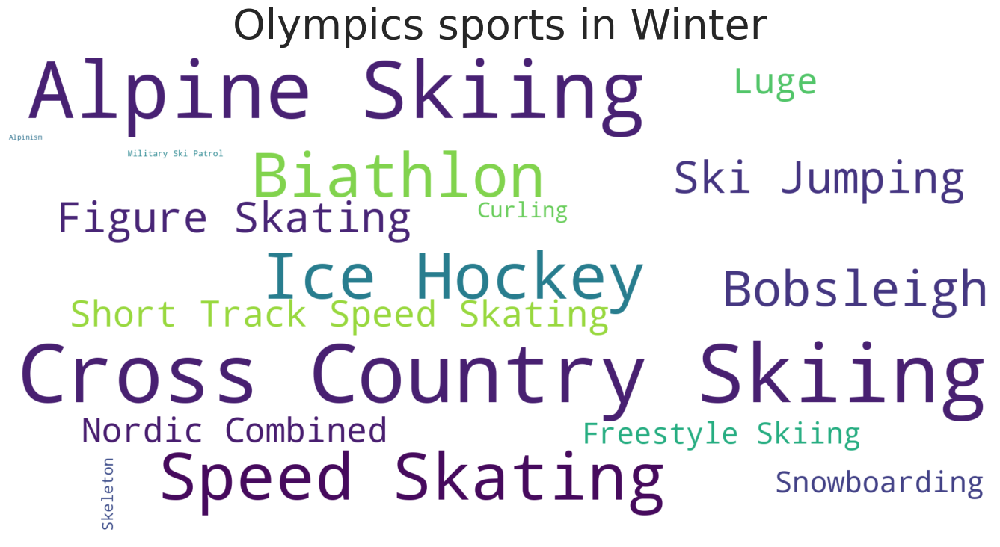

In [73]:
winter = athletes_df[athletes_df['Season'] == 'Winter']
count_values = winter['Sport'].value_counts()
    
sns.set_style("ticks")

wordcloud = WordCloud(
            width=2000,
            height=1000, 
            scale=1,
            normalize_plurals=False,
            repeat=False,
            random_state=42,
            background_color='white')

wordcloud.generate_from_frequencies(frequencies=count_values)
plt.figure(figsize=(17,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Olympics sports in Winter', fontsize=40)
plt.show()

The most popular winter season games are displayed in this wordcloud. The most popular winter sports are Cross-Country Skiing, Speed Skating, and Alpine Skiing. Alpinism is less widespread. Each word's size in the data set indicates how frequently it occurs.

### Medals

In [74]:
Medals = athletes_df.Medal.value_counts()
Medals

no medal    221025
Gold         13221
Bronze       13002
Silver       12812
Name: Medal, dtype: int64

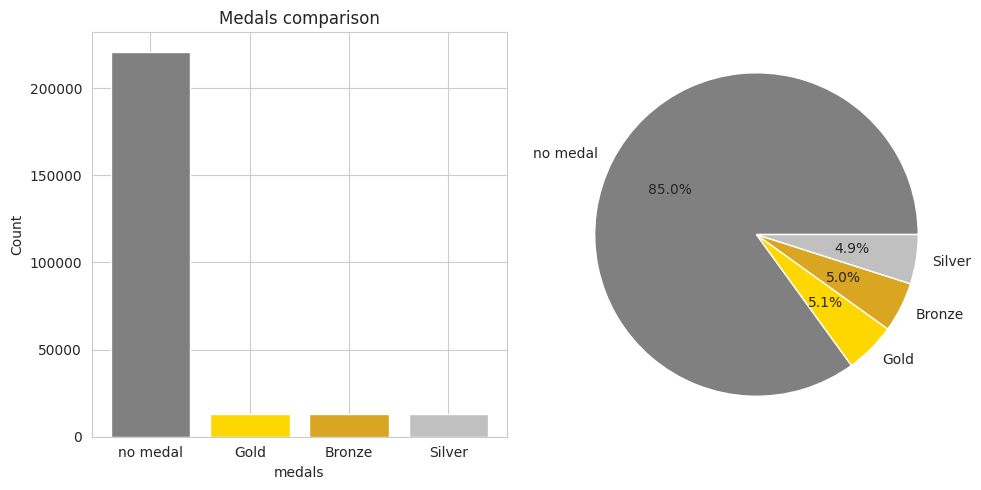

In [75]:
sns.set_style("whitegrid")
colors = {'no medal':'grey','Gold':'gold','Bronze':'goldenrod','Silver':'silver'}

# 2 subplots 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# bar chart 
ax1.bar(x=Medals.index, height=Medals.values,color=[colors[x] for x in Medals.index])
ax1.set_title('Medals comparison')
ax1.set_xlabel('medals')
ax1.set_ylabel('Count')

# pie chart
sizes = [Medals['no medal'], Medals['Gold'],Medals['Bronze'],Medals['Silver']]
labels = ['no medal', 'Gold','Bronze','Silver']
ax2.pie(sizes, labels=labels,colors=[colors[x] for x in labels], autopct='%1.1f%%')

plt.tight_layout()
plt.show()

The two plots show the distribution of medal types won by athletes in the Olympic Games. The left plot is a bar chart that shows the count of each medal type. However, the right plot is a pie chart that shows the percentage of each medal type.

We can tell that the distribution of medals is imbalanced, with a large percentage of athletes not winning a medal. The percentage of athletes who did not win a medal is the highest at 85%, while the percentage of athletes who won bronze ,silver or gold medals is 5%. This suggests that winning a medal in the Olympic Games is a significant achievement and a rare occurrence.



### Host Cities

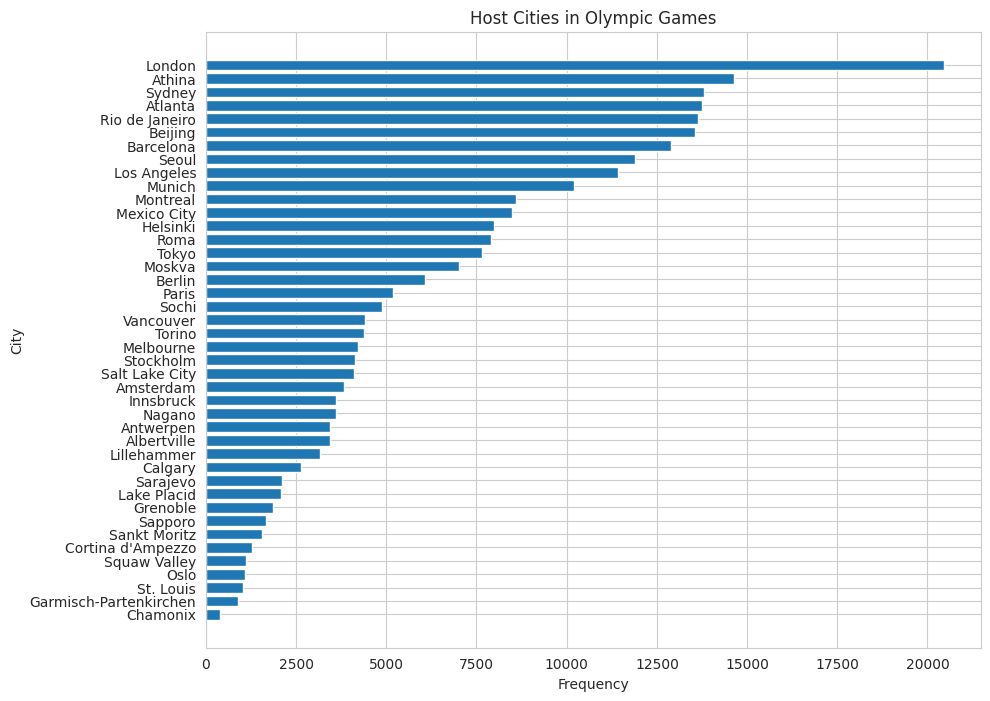

In [76]:
hostCity = athletes_df['City'].value_counts()

# horizontal bar chart of the cities
plt.figure(figsize=(10,8))
plt.barh(hostCity.index, hostCity.values)
plt.title('Host Cities in Olympic Games')
plt.xlabel('Frequency')
plt.ylabel('City')
plt.gca().invert_yaxis()
plt.show()

The frequency of Olympic host cities is shown in this plot. With a frequency of over 20,000, London is the most frequent host city. Athina with 14900, Sydney and Atlanta are next, with frequencies of about 13,000 each. The frequency is lowest in Chamonix, where it is only around 750.

### Regions

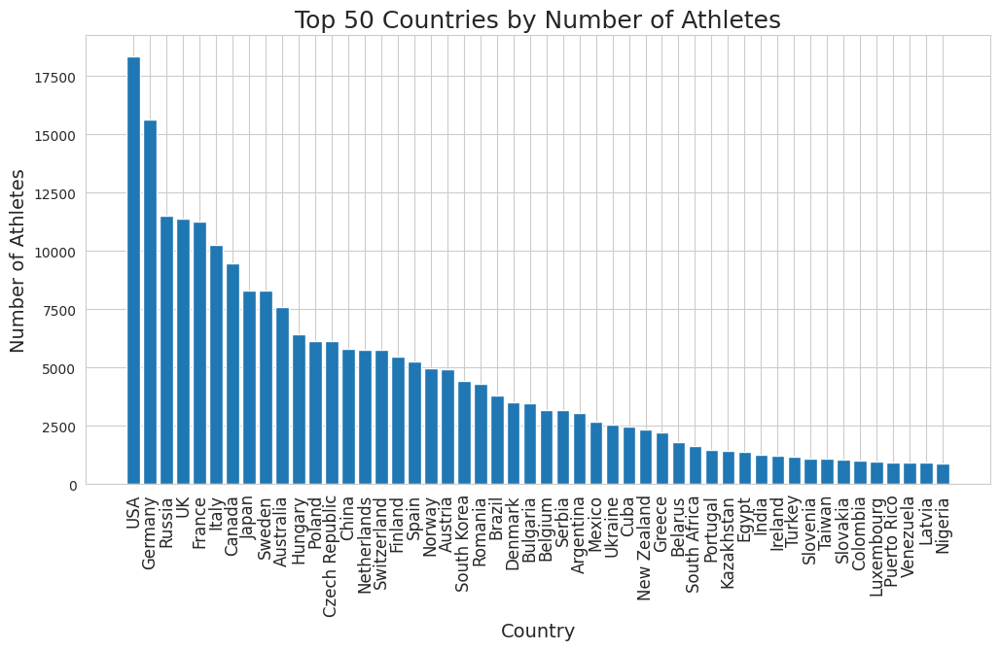

In [77]:
# value counts of the top 50 
top_countries = athletes_df['region'].value_counts().nlargest(50)

plt.figure(figsize=(12,6))
plt.bar(top_countries.index, top_countries.values)
plt.title('Top 50 Countries by Number of Athletes', fontsize=18)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Number of Athletes', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.show()

With almost 18,000 athletes, the United States has the largest representation of athletes in the dataset, Germany comes in second with 15,200 athletes. While other nations have significantly lower participation rates, with a slow decline seen as we move down the list.

In [78]:
country_count = athletes_df.groupby(['region', 'Year'])['ID'].count().reset_index()

#filter the grouped data to only include the year 1992
c1992 = country_count[country_count['Year'] == 1992]

# choropleth map
fig = px.choropleth(c1992, locations='region', locationmode='country names',color='ID',
                    animation_frame='Year', title='Number of Athletes per Country in 1992')
fig.update_layout(
    geo = dict(projection={'type':'natural earth'})
)

fig.show()

the year 1992 had the highest number of athletes and both seasons were held together in it. so in the plot above we can see that as the color gets lighter the number of athletes is higher. From USA, there are 967 participants  which is the highest in 1992. followed by russia with 861. On the other hand, Africa and South America had a less number of athletes.

### Athlete with the maximum age

In [79]:
athletes_df[athletes_df.Age==97]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
255752,128719,John Quincy Adams Ward,M,97.0,178.895419,75.786633,United States,USA,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Sculpturing, Statues",no medal,USA


the maximum age existed in the dataset is 97 which may be unusual but the athlete was playing in 1928 and the his sport was 'Art Competitions. Art Competitions were a part of the Olympics until 1948, and age is not necessarily a limiting factor for participation in that category.

In [80]:
athletes_df[athletes_df.Name=='John Quincy Adams Ward']

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
255752,128719,John Quincy Adams Ward,M,97.0,178.895419,75.786633,United States,USA,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Sculpturing, Statues",no medal,USA


by filtering the dataset with his name we can see that he hadn't participated in any events before that only one time.

### Athlete with the highest weight

In [81]:
athletes_df.loc[athletes_df.Weight == 214]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
23052,12177,"Ricardo Blas, Jr.",M,21.0,183.0,214.0,Guam,GUM,2008,Summer,Beijing,Judo,Judo Men's Heavyweight,no medal,Guam
23053,12177,"Ricardo Blas, Jr.",M,25.0,183.0,214.0,Guam,GUM,2012,Summer,London,Judo,Judo Men's Heavyweight,no medal,Guam


We can see that mr. ricardo is a judo player which explains his weight being the highest out of all other athletes in the dataset. He played two times in two different years and different cities ,but he didn't win any medals.

### Athlete who won the highest number of medals

In [82]:
# athlete who won the most number of medals
most_medals = athletes_df[athletes_df['Medal'] != 'no medal'].groupby('Name')['Medal'].count().nlargest(1)
name = most_medals.index[0]

# filtering to see data including his name only
most_medals = athletes_df[(athletes_df['Name'] == name) & (athletes_df['Medal'] != 'no medal')]

# count the number medals won by the athlete
medal_counts = most_medals['Medal'].value_counts()

# printing results
print(f"The athlete with the most medals is {name} ")
print("Medal counts:")
for medal, count in medal_counts.items():
    print(f"{medal.capitalize()}: {count}")

The athlete with the most medals is Michael Fred Phelps, II 
Medal counts:
Gold: 23
Silver: 3
Bronze: 2


In [83]:
most_medals.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal,region
186865,94406,"Michael Fred Phelps, II",M,19.0,193.0,91.0,United States,USA,2004,Summer,Athina,Swimming,Swimming Men's 200 metres Freestyle,Bronze,USA
186866,94406,"Michael Fred Phelps, II",M,19.0,193.0,91.0,United States,USA,2004,Summer,Athina,Swimming,Swimming Men's 4 x 100 metres Freestyle Relay,Bronze,USA
186867,94406,"Michael Fred Phelps, II",M,19.0,193.0,91.0,United States,USA,2004,Summer,Athina,Swimming,Swimming Men's 4 x 200 metres Freestyle Relay,Gold,USA
186868,94406,"Michael Fred Phelps, II",M,19.0,193.0,91.0,United States,USA,2004,Summer,Athina,Swimming,Swimming Men's 100 metres Butterfly,Gold,USA
186869,94406,"Michael Fred Phelps, II",M,19.0,193.0,91.0,United States,USA,2004,Summer,Athina,Swimming,Swimming Men's 200 metres Butterfly,Gold,USA


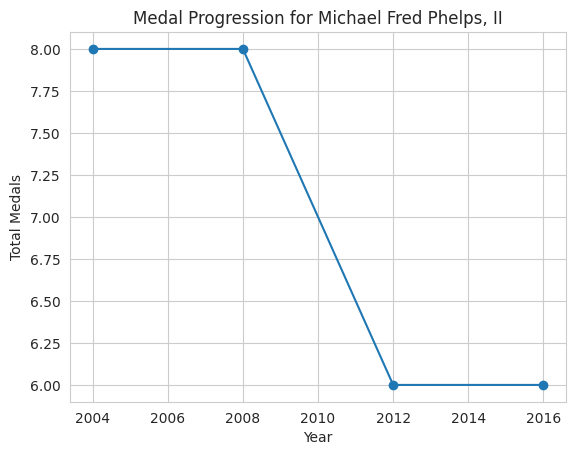

In [87]:
# count the number of medals won by the athlete in each edition of the Olympics
yearCounts = pd.pivot_table(most_medals, index='Year', columns='Medal', values='Name', aggfunc='count', fill_value=0)

# adding 'Total' column
yearCounts['Total'] = yearCounts.sum(axis=1)

# create a line chart
plt.plot(yearCounts.index, yearCounts['Total'], marker='o')
plt.xlabel('Year')
plt.ylabel('Total Medals')
plt.title(f"Medal Progression for {name}")
plt.show()

The progression of Michael Phelps' total number of medals through time is seen in this line graph. He won a total of 8 medals in 2004 regardless of the type of the medal. He continued to play well in 2008 by bringing home an additional 8 medals. With only 6 medals earned in 2012, we may see a deterioration in his performance. Then he continued in the same performance in 2016. Overall, the line graph highlights Phelps' amazing medal total while also emphasizing his performance's minor drop in his later Olympic outings.

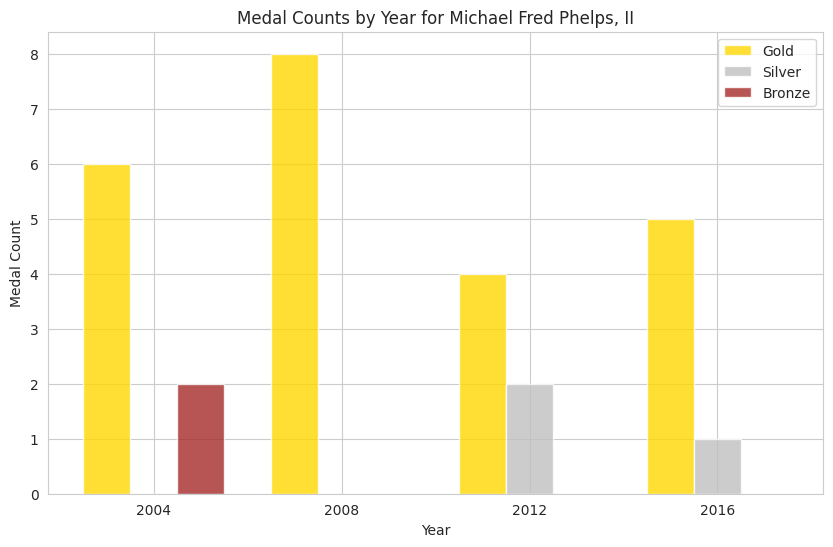

In [85]:
ymedal_counts = most_medals.groupby(['Year', 'Medal'])['Medal'].count().unstack(fill_value=0)

fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.25
opacity = 0.8

years = ymedal_counts.index.tolist()
gold = ymedal_counts['Gold'].tolist()
silver = ymedal_counts['Silver'].tolist()
bronze = ymedal_counts['Bronze'].tolist()

index = np.arange(len(years))
rects1 = ax.bar(index, gold, bar_width, alpha=opacity, color='gold', label='Gold')
rects2 = ax.bar(index + bar_width, silver, bar_width, alpha=opacity, color='silver', label='Silver')
rects3 = ax.bar(index + 2*bar_width, bronze, bar_width, alpha=opacity, color='brown', label='Bronze')

ax.set_xlabel('Year')
ax.set_ylabel('Medal Count')
ax.set_title(f'Medal Counts by Year for {name}')
ax.set_xticks(index + bar_width)
ax.set_xticklabels(years)
ax.legend()

plt.show()

The type of medals won by Michael Fred Phelps II at the Olympics over time is depicted in this bar chart. Phelps took home 6 gold and 2 bronze medals in 2004. He broke a record in 2008 by earning 8 gold medals. He won 4 gold and 2 silver medals in 2012. Phelps finished the year with 5 gold and 1 silver medal. The graph displays Phelps' success as one of the best athletes of all time and showcases his remarkable Olympic accomplishments.

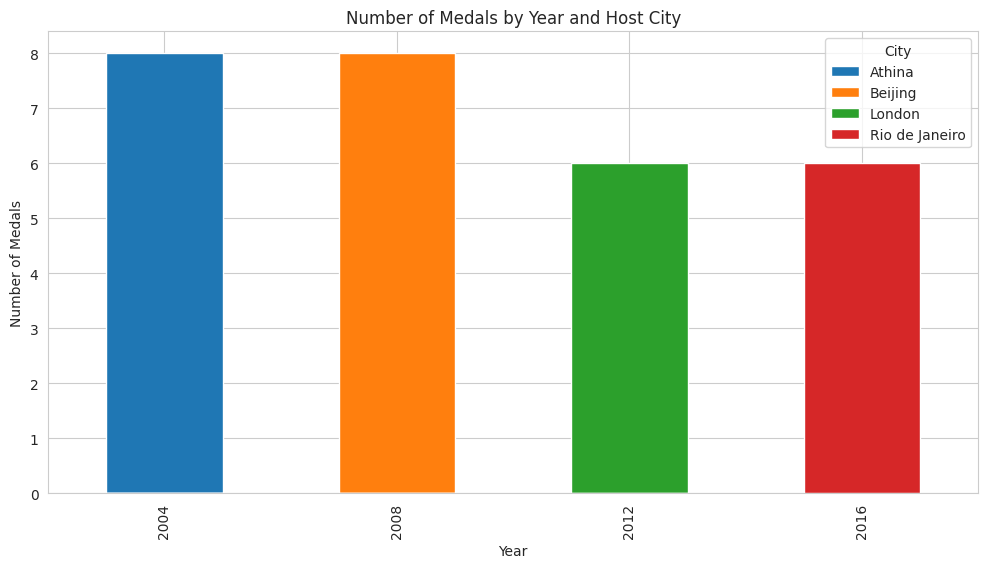

In [86]:
citymedals = most_medals.groupby(['Year', 'City'])['Medal'].count().unstack()

# Create a stacked bar chart
citymedals.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Number of Medals by Year and Host City')
plt.xlabel('Year')
plt.ylabel('Number of Medals')
plt.show()

Michael Phelps' total number of swimming medals, along with each year's host cities, are shown in this bar graph. Phelps earned eight medals in swimming competitions in the city of Athens in 2004. He earned additional swimming medals in Beijing in 2008. He decreased his medal total in 2012 by winning less swimming medals in London. Finally, Phelps continued his swimming success in 2016 by bringing home 6 medals from Rio de Janeiro. This graph shows Phelps' swimming supremacy and his ability to consistently perform well in different host cities over the years.

## 4- Data Modeling


###   Imbalance issue 
---

Having an imbalanced class is an issue that should be solved before training and testing your machine learning models. This issue occurs when one class or more in classification problems has higher or less number of samples compared to the rest. Imbalance can significantly affect the models' performance and it can leads to bias results.

Models typically perform well on the majority class but poorly on the minority classes in datasets with imbalance issue. To ensure that the model can correctly classify all classes, not only the majority class, it is necessary to address the imbalance issue.


### Undersampling using RandomUnderSampler
---

Reducing the number of samples in the majority class is a method used in data balancing to deal with the imbalance between classes.  This method involves randomly selecting samples from the majority class and removing them from the dataset until there is a balance between the majority and minority classes. Random under-sampling's main benefit is that it can be quicker and more computationally efficient than other methods. However, when the minority class has too few samples, this approach may result in information loss and may not be successful.

In [ ]:
#Split our data into features(X) and labels(y)
X=athletes_df.drop('Medal',axis=1)
y=athletes_df['Medal']

Text(0.5, 1.0, 'Balanced Classes')

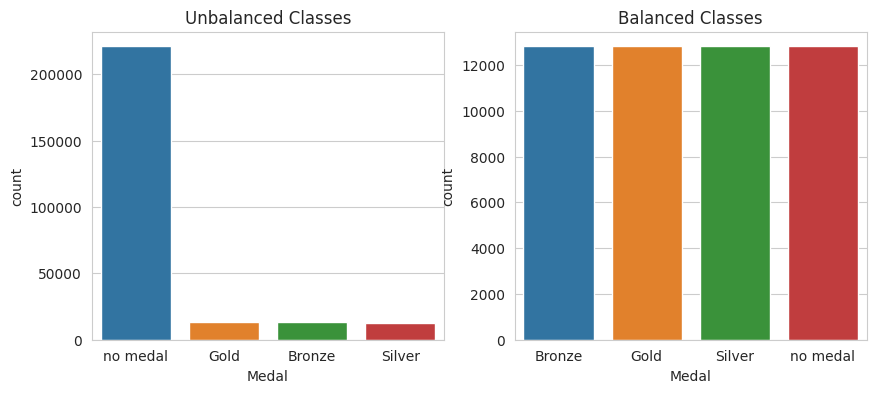

In [ ]:
#Randomly undersample the majority class 
RUSampler = RandomUnderSampler(random_state=10, sampling_strategy='not minority') 
x_under,y_under = RUSampler.fit_resample(X,y) 
undersampled = pd.DataFrame(y_under,columns=['Medal'])

# countplots
plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)

sns.countplot(x=athletes_df['Medal'])
plt.title('Unbalanced Classes')

plt.subplot(1,2,2)

sns.countplot(x=undersampled['Medal'])
plt.title('Balanced Classes')

These bar plots help with visualizing how the minority and majority classes changed after performing the undersampling to help solve the imbalance issue. The barplot on the left side shows the frequency/count of each class and as discussed previously, we noticed that the 'no medal' class has the highest frequency and it represent 85% of the medal class  and the classes 'bronze', 'silver', and 'gold' have the lowest frequency 5%. This demonstrate that there is a significant difference between them.

However, on the right barplot we can see the distribution after the undersampling where all classes has the same number of samples (12812) which simply solves the issue.

In [ ]:
#class distribution
y_under.value_counts()

Bronze      12812
Gold        12812
Silver      12812
no medal    12812
Name: Medal, dtype: int64

In [ ]:
athletes_df = pd.concat([x_under, y_under], axis=1)

In [ ]:
import pycaret

The Python machine learning library PyCaret offers an intuitive user interface for end-to-end machine learning operations. It seeks to streamline and simplify the machine learning process from model development through data preparation. In addition to tools for data preparation, feature engineering, model tuning , and interpretation, PyCaret provides a number of machine learning techniques, including regression, classification, clustering, and anomaly detection. Additionally, it supports a number of sophisticated features, such as multi-class classification, model ensembling, and automatic hyperparameter tuning. Users may quickly and simply create and deploy machine learning models with PyCaret with little coding or technical expertise.

In [ ]:
# import pycaret classification and init setup
from pycaret.classification import *
s = setup(athletes_df, target = 'Medal', session_id = 124)

,Description,Value
0,Session id,124
1,Target,Medal
2,Target type,Multiclass
3,Target mapping,"Bronze: 0, Gold: 1, Silver: 2, no medal: 3"
4,Original data shape,"(51248, 15)"
5,Transformed data shape,"(51248, 15)"
6,Transformed train set shape,"(35873, 15)"
7,Transformed test set shape,"(15375, 15)"
8,Ordinal features,2
9,Numeric features,5


In [ ]:
# compare baseline models
model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.5042,0.7869,0.5042,0.5613,0.4813,0.3389,0.3576,6.7910
lda,Linear Discriminant Analysis,0.3795,0.6466,0.3795,0.3698,0.3714,0.1727,0.1737,1.2100
ridge,Ridge Classifier,0.3769,0.0000,0.3769,0.3594,0.3543,0.1691,0.1735,1.3560
rf,Random Forest Classifier,0.3758,0.6711,0.3758,0.4766,0.3345,0.1677,0.1915,9.0110
ada,Ada Boost Classifier,0.3663,0.6178,0.3663,0.3635,0.3608,0.1551,0.1564,4.7620
qda,Quadratic Discriminant Analysis,0.3381,0.6148,0.3381,0.3508,0.2862,0.1174,0.1400,1.6680
gbc,Gradient Boosting Classifier,0.3253,0.5951,0.3253,0.3636,0.2888,0.1004,0.1137,30.3670
nb,Naive Bayes,0.3130,0.5774,0.3130,0.2984,0.2820,0.0839,0.0884,1.1550
dt,Decision Tree Classifier,0.2890,0.5260,0.2890,0.3420,0.2304,0.0521,0.0617,1.6840
knn,K Neighbors Classifier,0.2841,0.5407,0.2841,0.2876,0.2811,0.0455,0.0459,2.4610


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

After creating a machine learning model, it is a must to evaluate the model. Understanding how the model performs on the data and whether it generalizes well to new, unseen data is very important. Depending on the model that is being used and the type of problem, there are many evaluation metrics convenient.

For instance, accuracy, precision, recall, F1 score, and AUC-ROC are some frequently used metrics for evaluation  in classification problems.


**Accuracy is how close/far off a given set of measurements are to their true values.**

 $ \text{Accuracy}=\frac{TN+TP}{TN+FP+TP+FN} $

**TP** : True Positive 
**FP** : False Positive 
**TN** : True Negative 
**FN** : False Negative 

A **true positive** is an outcome where the model correctly predicts the positive class, similarly a **true negative** is an outcome where the model correctly predicts the negative class. 

A **false positive** is an outcome where the model incorrectly predicts the positive class, and a **false negative** is an outcome where the model incorrectly predicts the negative class. 

based on the results we got after implementing pycaret to help find the model with the highest accuracy, we got **0.50** as the best accuracy from the Extra trees classifier compared to other classification models.



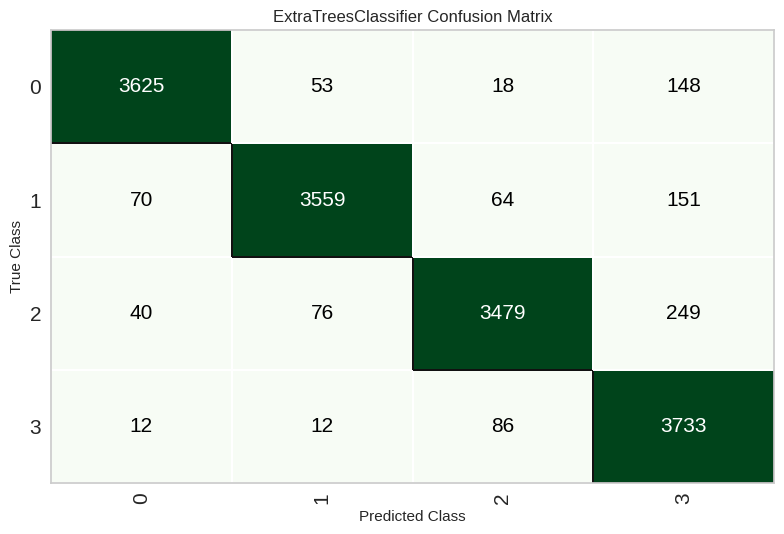

In [ ]:
# plot confusion matrix
plot_model(model, plot = 'confusion_matrix')

A confusion matrix is a table that compares predicted values to actual values to assess how well a machine learning model is performing. The number of true positive, true negative, false positive, and false negative values are used to determine how accurate the classification model is.

The diagonal shows the correctly predicted values, where 3625 values of the bronze medals where predicted correctly and 3559 of the gold medals were predicted correctly ,in addition to 3479 silver medals were correctly predicted and finally 3733 values of the 'no medal' class were predicted correctly.

There are 53, 18 and 148 of gold,silver and no medal classes respectively were actually bronze but incorrectly predicted.

70, 64 and 151 of the bronze silver and no medal classes respectively were actually gold but incorrectly predicted.

40, 76 and 249 of the bronze gold and no medal classes respectively were actually silver but incorrectly predicted.

12, 12, 86 of the bronze,gold and silver classes respectively were actually from the no medal class but incorrectly predicted.

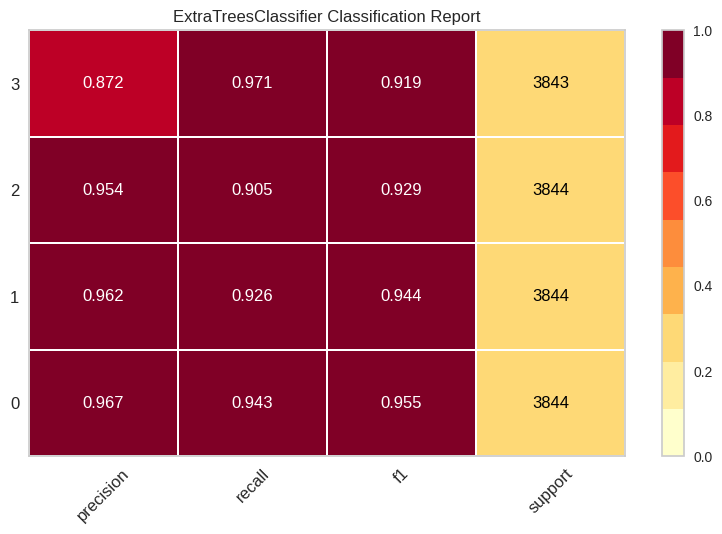

In [ ]:
# plot class report
plot_model(model,plot = 'class_report')

#### **Precision**
**Precision is how close or dispersed the measurements are to each other.**

 $ \text{Precision}=\frac{TP}{FP+TP} $

#### **Recall**
**Recall can be described as the ability of a model to find all the relevant cases within a dataset.**

 $ \text{Recall}=\frac{TP}{FN+TP} $

#### **F1 Score**  
**The harmonic mean of recall and precision**

 $\text{F1 Score}=2 * \frac{Precision * Recal}{Precision + Recall}$

#### **Support**

**Support in the classification report shows the number of samples for each class**

which we can see that they all have the same number of sample (3844) after applying the undersampling technique to solve the imbalance issue.

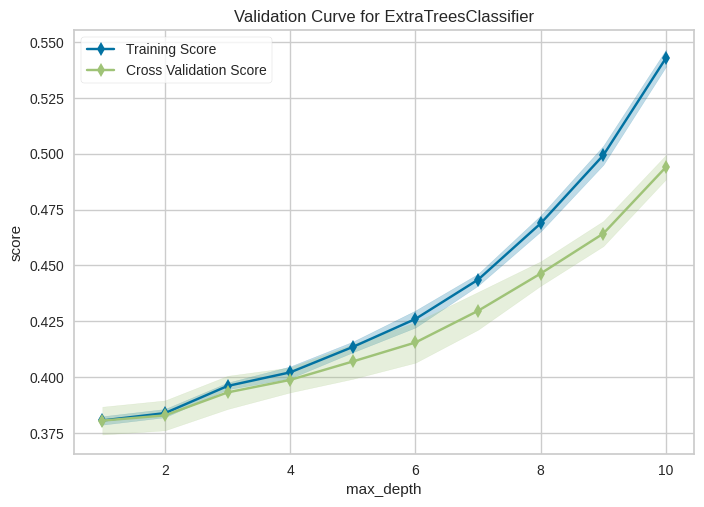

In [ ]:
# validation curve
plot_model(model, plot='vc')

A validation curve is a plot that shows the training and validation scores of an estimator for varying values of a hyperparameter. The plot helps to identify whether the model is overfitting or underfitting.

We can see in the plot above that the blue curve represents the training score and the green one represents the validation score. As the training score increases the validation score increases which means that the model is learning as we are feeding it with more data. but since we used undersampling the data size might not be enough for learning which explains why the accuracy score is only 0.5 .

### Oversampling using RandomOverSampler
---
One way of oversampling is to generate new samples for the minority class by sampling with replacement. the RandomOverSampler provides such functionality. 

Text(0.5, 1.0, 'Balanced Classes')

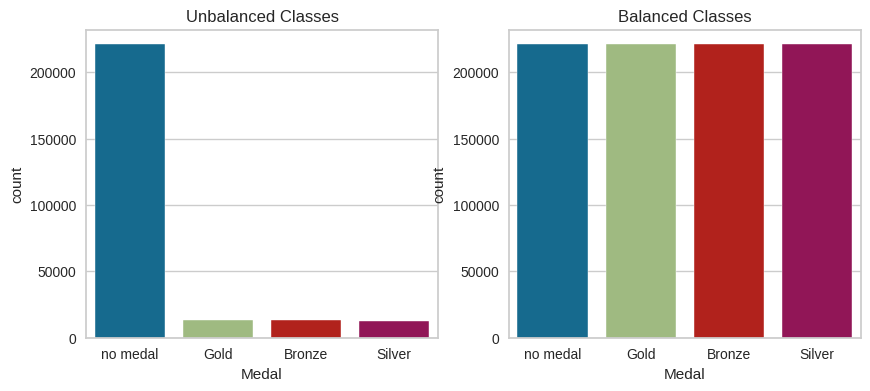

In [ ]:
# Separate input features and target
y = athletes_df.Medal
X = athletes_df.drop('Medal', axis=1)

ros = RandomOverSampler(random_state=10, sampling_strategy='not majority')
X_overS, y_overS = ros.fit_resample(X, y)

oversampled = pd.DataFrame(y_overS,columns=['Medal'])

plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)

sns.countplot(x=athletes_df['Medal'])
plt.title('Unbalanced Classes')

plt.subplot(1,2,2)

sns.countplot(x=oversampled['Medal'])
plt.title('Balanced Classes')

After applying the oversampling technique to solve the imbalance issue, we can see that the minority classes (gold,silver and gold) increased to match the majority class (no medal)

In [ ]:
oversampled= pd.concat([X_overS, y_overS], axis=1)

In [ ]:
# import pycaret classification and init setup
from pycaret.classification import *
s = setup(oversampled, target = 'Medal', session_id = 123)

,Description,Value
0,Session id,123
1,Target,Medal
2,Target type,Multiclass
3,Target mapping,"Bronze: 0, Gold: 1, Silver: 2, no medal: 3"
4,Original data shape,"(884100, 15)"
5,Transformed data shape,"(884100, 15)"
6,Transformed train set shape,"(618870, 15)"
7,Transformed test set shape,"(265230, 15)"
8,Ordinal features,2
9,Numeric features,5


In [ ]:
# compare baseline models
best = compare_models(include = ['lr', 'knn', 'nb', 'ada', 'ridge', 'et','lda'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9291,0.9948,0.9291,0.9348,0.9293,0.9055,0.9072,120.3400
knn,K Neighbors Classifier,0.8971,0.9695,0.8971,0.9088,0.8883,0.8628,0.8703,20.8060
ada,Ada Boost Classifier,0.7348,0.8386,0.7348,0.7853,0.7428,0.6464,0.6598,50.8610
lda,Linear Discriminant Analysis,0.6755,0.8826,0.6755,0.6867,0.6741,0.5673,0.5715,8.6400
ridge,Ridge Classifier,0.5906,0.0000,0.5906,0.6228,0.5585,0.4542,0.4735,6.9590
nb,Naive Bayes,0.5851,0.7829,0.5851,0.6007,0.5872,0.4467,0.4498,7.4490
lr,Logistic Regression,0.2519,0.5053,0.2519,0.1259,0.1678,0.0025,0.0031,20.7670


Processing:   0%|          | 0/33 [00:00<?, ?it/s]

by implementing these models shown above we can see that the performance of extra trees classifier was the best with accuracy = 0.92.

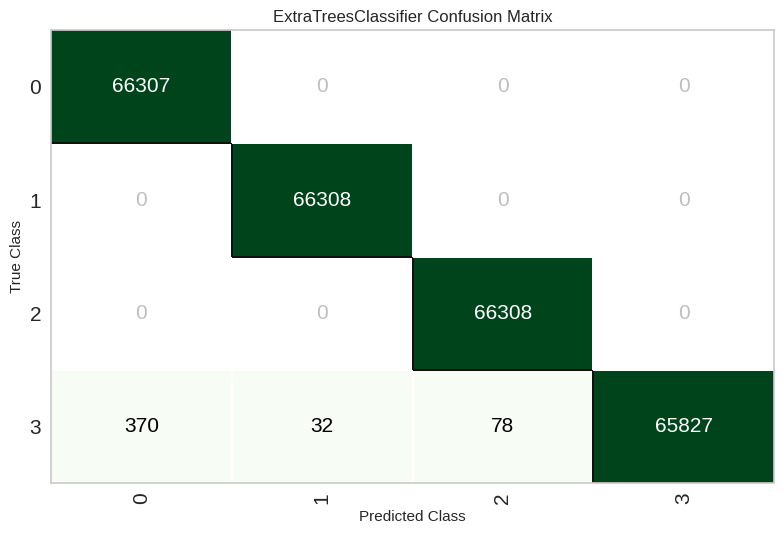

In [ ]:
# plot confusion matrix
plot_model(best, plot = 'confusion_matrix')

from the confusion matrix above, we can see that bronze, gold and silver were predicted correctly without any misclassification which might be caused from using the Random over sampling technique for the oversampling since it generates instances of the same data we have.

However, for the 'no medal' class there are 370 ,32 and 78 values were predicted as bronze ,gold and silver classes respectively.

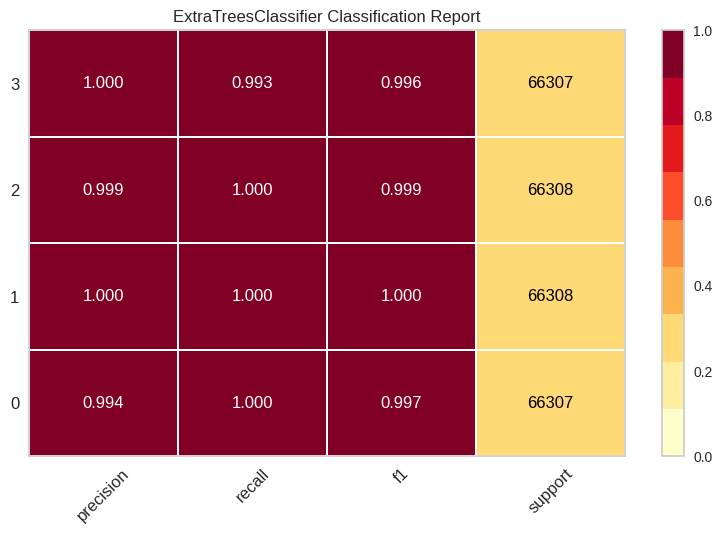

In [ ]:
# plot class report
plot_model(best, plot = 'class_report')

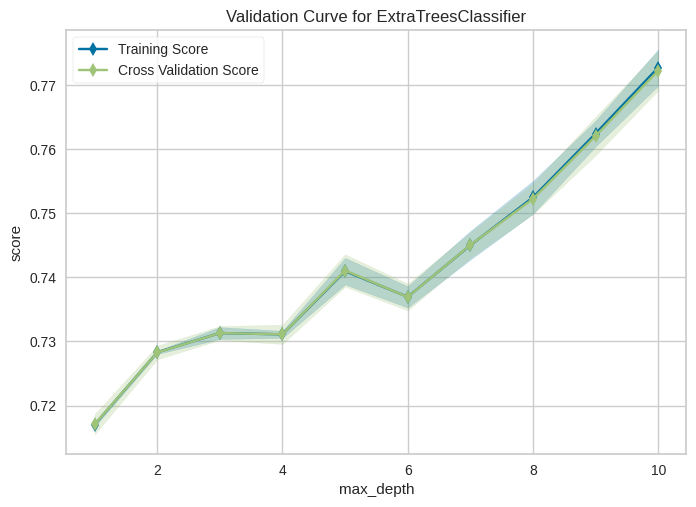

In [ ]:
plot_model(best, plot='vc')

In this validation curve,the training score kept increasing until it reaches a score of 0.78. The green line is consistently on top of the blue line as it increases which means that the model is fitting too closely to the training data, and is not able to generalize well to new data.

## Conclusion 

Eventually, the goal of this project was to explore and examine the Olympic Games dataset from 1896 to 2016. The dataset involves details on the countries, sports, medals, and participants taking part in the Olympic Games.

Interesting information was discovered from the exploratory data analysis, including the seasons' most popular sports and patterns in the number of athletes. Additionally, we looked at how athletes' mean ages, heights, and weights vary . We performed further analyses on the athlete  who collected the most  number  of medals.

The chances that an athlete will win a medal depending on their age, gender, height, and weight was also predicted using machine learning algorithms. The models achieved reasonable accuracy, with the ExtraTreesClassifier performing the best.

In conclusion, our study showed the effectiveness of exploratory data analysis, machine learning, and data visualization for learning and understanding from massive datasets. Athletes, coaches, and sports organizations may find the insights helpful in improving decisions and performance.

